<a href="https://colab.research.google.com/github/fibleep/michael-cera-detector/blob/main/main.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [173]:
import os
import cv2
import tarfile
import numpy as np
from urllib import request
from google.colab import drive
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt
import keras
import tensorflow as tf


base_path = "/content/sample_data/CV__Group_assignment"

if not os.path.isdir(base_path):
  os.makedirs(base_path)

trained_haarcascade_url = "https://raw.githubusercontent.com/opencv/opencv/master/data/haarcascades/haarcascade_frontalface_default.xml"

with request.urlopen(trained_haarcascade_url) as r, open(os.path.join(base_path, "haarcascade_frontalface_default.xml"), 'wb') as f:
    f.write(r.read())

# Implementing Transfer Learning for Michael Cera detection

Get the dataset

In [174]:
!git clone https://github.com/fibleep/michael-cera-detector.git

fatal: destination path 'michael-cera-detector' already exists and is not an empty directory.


In [175]:
from keras.preprocessing.image import ImageDataGenerator

directory = '/content/michael-cera-detector/dataset'

# Keras Image Data Generator with augmentation
augment_datagen = ImageDataGenerator(
    rescale=1./255,         # Normalize the pixels
    rotation_range=20,      # Degree range for random rotations
    width_shift_range=0.2,  # Range for random horizontal shifts
    height_shift_range=0.2, # Range for random vertical shifts
    shear_range=0.2,        # Shear angle in counter-clockwise direction
    zoom_range=0.2,         # Random zoom range
    horizontal_flip=True,   # Randomly flip inputs horizontally
    fill_mode='nearest'     # Strategy used for filling in newly created pixels
)

normal_datagen = ImageDataGenerator(rescale=1./255)
batch_size = 128 # How many images loaded in at once, in this case we load in everything
target_size = (224, 224)  # Image dimensions

# Create a generator for reading images from the directory
train_imgs = normal_datagen.flow_from_directory(
    directory + "/train",
    target_size=target_size,
    batch_size=batch_size,
    class_mode='categorical'
)

train_imgs_augmented = augment_datagen.flow_from_directory(
    directory + "/train",
    target_size=target_size,
    batch_size=batch_size,
    class_mode='categorical'
)

test_imgs = normal_datagen.flow_from_directory(
    directory + "/test",
    target_size=target_size,
    batch_size=batch_size,
    class_mode='categorical'
)

Found 35 images belonging to 2 classes.
Found 35 images belonging to 2 classes.
Found 20 images belonging to 2 classes.


# Extract Faces

In [176]:
def get_all_images_and_labels_combined(normal_gen, augmented_gen):
    def extract_data(generator):
        num_samples = generator.samples
        data_size = num_samples // batch_size + (1 if num_samples % batch_size else 0)

        all_imgs = None
        all_labels = None

        for i in range(data_size):
            imgs, labels = next(generator)
            if all_imgs is None:
                all_imgs = imgs
                all_labels = labels
            else:
                all_imgs = np.concatenate((all_imgs, imgs))
                all_labels = np.concatenate((all_labels, labels))

        return all_imgs, all_labels

    normal_imgs, normal_labels = extract_data(normal_gen)
    augmented_imgs, augmented_labels = extract_data(augmented_gen)

    combined_imgs = np.concatenate((normal_imgs, augmented_imgs))
    combined_labels = np.concatenate((normal_labels, augmented_labels))

    return combined_imgs, combined_labels


combined_train_imgs, combined_train_labels = get_all_images_and_labels_combined(train_imgs, train_imgs_augmented)


Found 1 face(s)!


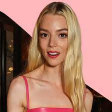

Found 0 face(s)!


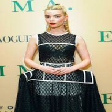

Found 1 face(s)!


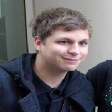

Found 1 face(s)!


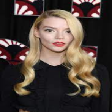

Found 1 face(s)!


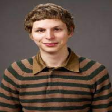

Found 0 face(s)!


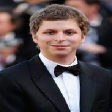

Found 1 face(s)!


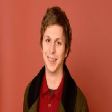

Found 1 face(s)!


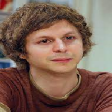

Found 1 face(s)!


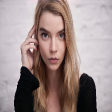

Found 1 face(s)!


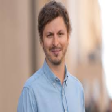

Found 2 face(s)!


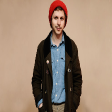

Found 1 face(s)!


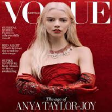

Found 1 face(s)!


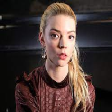

Found 0 face(s)!


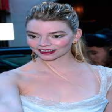

Found 1 face(s)!


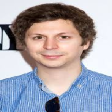

Found 1 face(s)!


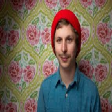

Found 1 face(s)!


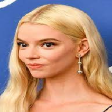

Found 0 face(s)!


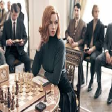

Found 1 face(s)!


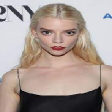

Found 1 face(s)!


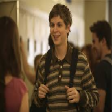

Found 1 face(s)!


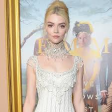

Found 1 face(s)!


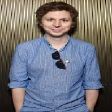

Found 0 face(s)!


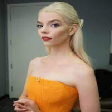

Found 2 face(s)!


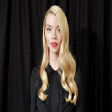

Found 1 face(s)!


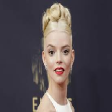

Found 1 face(s)!


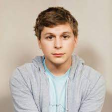

Found 0 face(s)!


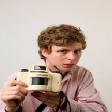

Found 1 face(s)!


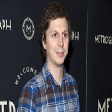

Found 1 face(s)!


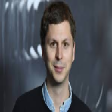

Found 1 face(s)!


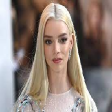

Found 1 face(s)!


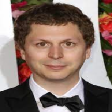

Found 0 face(s)!


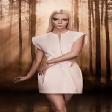

Found 1 face(s)!


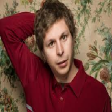

Found 0 face(s)!


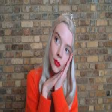

Found 1 face(s)!


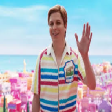

Found 1 face(s)!


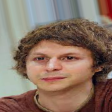

Found 1 face(s)!


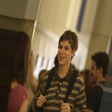

Found 1 face(s)!


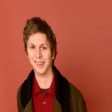

Found 1 face(s)!


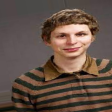

Found 1 face(s)!


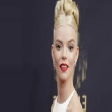

Found 0 face(s)!


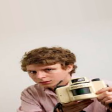

Found 0 face(s)!


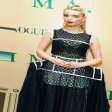

Found 1 face(s)!


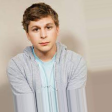

Found 1 face(s)!


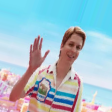

Found 1 face(s)!


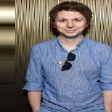

Found 0 face(s)!


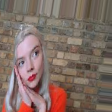

Found 0 face(s)!


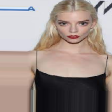

Found 1 face(s)!


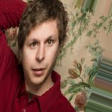

Found 1 face(s)!


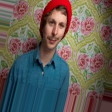

Found 0 face(s)!


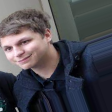

Found 1 face(s)!


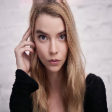

Found 0 face(s)!


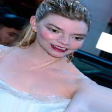

Found 1 face(s)!


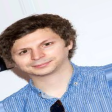

Found 0 face(s)!


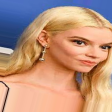

Found 0 face(s)!


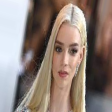

Found 0 face(s)!


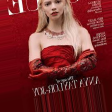

Found 0 face(s)!


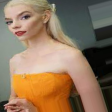

Found 1 face(s)!


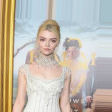

Found 1 face(s)!


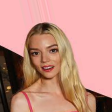

Found 1 face(s)!


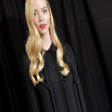

Found 1 face(s)!


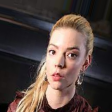

Found 2 face(s)!


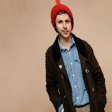

Found 1 face(s)!


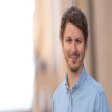

Found 0 face(s)!


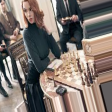

Found 1 face(s)!


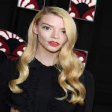

Found 1 face(s)!


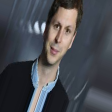

Found 1 face(s)!


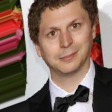

Found 0 face(s)!


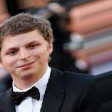

Found 0 face(s)!


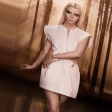

Found 1 face(s)!


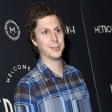

In [177]:
faceCascade = cv2.CascadeClassifier(os.path.join(base_path, "haarcascade_frontalface_default.xml"))

X = []
Y = []

for img,label in zip(combined_train_imgs, combined_train_labels):
    img = (img * 255).astype(np.uint8)
    img_ = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
    img_gray = img.copy()
    faces = faceCascade.detectMultiScale(
        img_gray,
        scaleFactor=1.2,
        minNeighbors=5,
        minSize=(30, 30),
        flags=cv2.CASCADE_SCALE_IMAGE
    )
    print("Found {} face(s)!".format(len(faces)))
    img_resized = cv2.resize(img, (224, 224))
    X.append(img_resized)
    Y.append(label)

    for (x, y, w, h) in faces:
        face = img_[y:y+h, x:x+w]
        face = cv2.cvtColor(face, cv2.COLOR_BGR2RGB)
        face = cv2.resize(face, (224, 224))
        X.append(face)
        Y.append(label)
        break

    h, w = img_.shape[:2]

    cv2_imshow(cv2.resize(img_, (w // 2, h // 2)))

In [178]:
# for face, one_hot_label in zip(X, Y):
#     plt.imshow(face)
#     plt.title(one_hot_label)
#     plt.show()

# Augment Data

In [179]:
image_iterator = augment_datagen.flow(np.array(X), np.array(Y), batch_size=128)

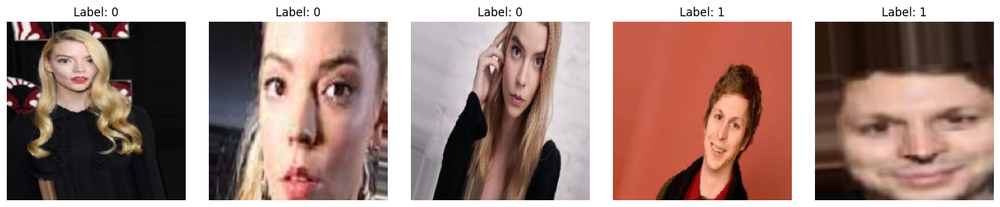

In [180]:
images, labels = next(image_iterator)

plt.figure(figsize=(15, 3))
for i in range(5):
    plt.subplot(1, 5, i + 1)
    plt.imshow(images[i])
    plt.title(f"Label: {np.argmax(labels[i])}")
    plt.axis('off')
plt.tight_layout()
plt.show()

In [181]:
# Augmented Images
len(X)

119

# Train Model

In [182]:
base_model = tf.keras.applications.VGG19(
    include_top=False,
    weights="imagenet",
    input_shape=(224, 224, 3),
    pooling=None
)

for layer in base_model.layers:
    layer.trainable = False

inputs = keras.Input(shape=(224, 224, 3))
x = base_model(inputs, training=False)
x = keras.layers.Conv2D(64, kernel_size=(3, 3), activation='relu', name="last_conv")(x) # Compress
x = keras.layers.BatchNormalization()(x) # Normalize the outputs, stabilize the learning
x = keras.layers.MaxPooling2D(pool_size=(2, 2))(x) # Compress
x = keras.layers.BatchNormalization()(x) # Normalize

x = keras.layers.Flatten()(x)
x = keras.layers.Dense(256, activation='relu')(x)
x = keras.layers.BatchNormalization()(x)
x = keras.layers.Dense(128, activation='relu')(x)
x = keras.layers.BatchNormalization()(x)

outputs = keras.layers.Dense(2, activation="softmax")(x)

model = keras.Model(inputs, outputs)

model.summary()


Model: "model_281"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_24 (InputLayer)       [(None, 224, 224, 3)]     0         
                                                                 
 vgg19 (Functional)          (None, 7, 7, 512)         20024384  
                                                                 
 last_conv (Conv2D)          (None, 5, 5, 64)          294976    
                                                                 
 batch_normalization_33 (Ba  (None, 5, 5, 64)          256       
 tchNormalization)                                               
                                                                 
 max_pooling2d_11 (MaxPooli  (None, 2, 2, 64)          0         
 ng2D)                                                           
                                                                 
 batch_normalization_34 (Ba  (None, 2, 2, 64)          25

In [183]:
test_images, test_labels = test_imgs[0]

test_X = []
test_Y = []

for image, label in zip(test_images, test_labels):
  test_X.append(image)
  test_Y.append(label)

In [184]:

def plot_image_grid(images, labels, rows, cols, title):
    fig, axes = plt.subplots(rows, cols, figsize=(15, rows * 3))
    axes = axes.flatten()

    for img, label, ax in zip(images, labels, axes):
        ax.imshow(img)
        ax.set_title(label)
        ax.axis('off')

    plt.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.show()


In [185]:
import numpy as np
from sklearn.model_selection import train_test_split
import keras
from keras.callbacks import ModelCheckpoint, EarlyStopping


train_batch = next(train_imgs)
test_batch = next(test_imgs)

model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-2),
    loss="binary_crossentropy",
    metrics=["accuracy"]
)
checkpoint_path = "best_model_checkpoint.h5"
checkpoint_callback = ModelCheckpoint(
    filepath=checkpoint_path,
    monitor='val_accuracy',
    verbose=1,
    save_best_only=True,
    mode='max'
)


early_stopping_callback = EarlyStopping(
    monitor='val_accuracy',
    patience=20,
    verbose=1,
    restore_best_weights=True
)


epochs = 50
history = model.fit(
    image_iterator, epochs=epochs, validation_data=(np.array(test_X), np.array(test_Y)),
    callbacks=[checkpoint_callback, early_stopping_callback]
)

Epoch 1/50
1/1 [==============================] - ETA: 0s - loss: 0.8177 - accuracy: 0.5546
Epoch 1: val_accuracy improved from -inf to 0.50000, saving model to best_model_checkpoint.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


1/1 [==============================] - 5s 5s/step - loss: 0.8177 - accuracy: 0.5546 - val_loss: 1.2278 - val_accuracy: 0.5000
Epoch 2/50
1/1 [==============================] - ETA: 0s - loss: 0.7470 - accuracy: 0.5966
Epoch 2: val_accuracy improved from 0.50000 to 0.55000, saving model to best_model_checkpoint.h5
1/1 [==============================] - 2s 2s/step - loss: 0.7470 - accuracy: 0.5966 - val_loss: 0.8914 - val_accuracy: 0.5500
Epoch 3/50
1/1 [==============================] - ETA: 0s - loss: 0.5155 - accuracy: 0.7731
Epoch 3: val_accuracy improved from 0.55000 to 0.60000, saving model to best_model_checkpoint.h5
1/1 [==============================] - 2s 2s/step - loss: 0.5155 - accuracy: 0.7731 - val_loss: 2.1928 - val_accuracy: 0.6000
Epoch 4/50
1/1 [==============================] - ETA: 0s - loss: 0.2692 - accuracy: 0.8824
Epoch 4: val_accuracy improved from 0.60000 to 0.65000, saving model to best_model_checkpoint.h5
1/1 [==============================] - 3s 3s/step - los

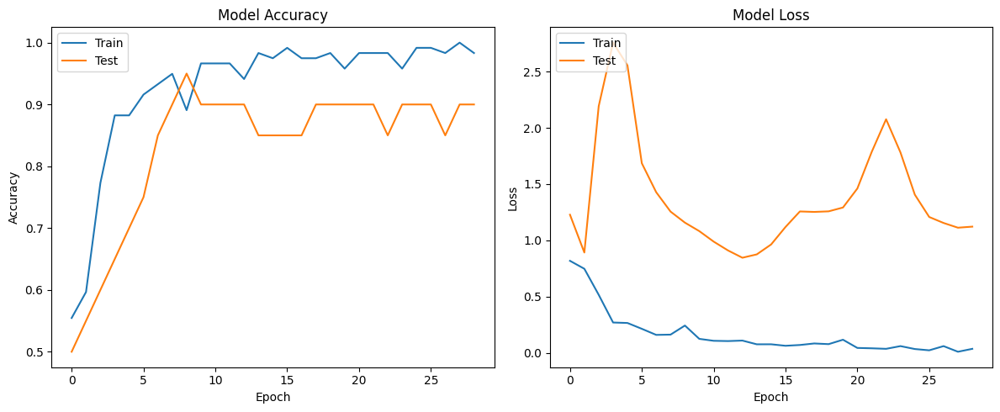

In [186]:
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')

plt.tight_layout()
plt.show()

# Test our Model

In [187]:
test_batch = next(test_imgs)
predictions = model.predict(test_batch[0])

1/1 [==============================] - 0s 220ms/step


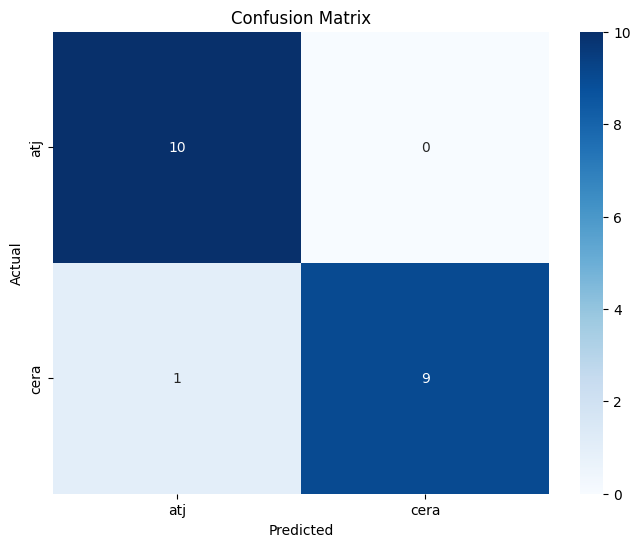

In [188]:
import numpy as np
from sklearn.metrics import confusion_matrix
import seaborn as sns

true_labels = []
predicted_labels = []

class_labels=["atj","cera"]

for idx, prediction in enumerate(predictions):
    predicted_class = np.argmax(prediction)
    predicted_label = class_labels[predicted_class]
    true_label = class_labels[np.argmax(test_batch[1][idx])]

    true_labels.append(true_label)
    predicted_labels.append(predicted_label)


label_to_num = {label: num for num, label in enumerate(class_labels)}
num_true_labels = [label_to_num[label] for label in true_labels]
num_predicted_labels = [label_to_num[label] for label in predicted_labels]
cm = confusion_matrix(num_true_labels, num_predicted_labels)


plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap='Blues',
            xticklabels=class_labels, yticklabels=class_labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title('Confusion Matrix')
plt.show()


# GRAD-CAM - Feature Extraction

Visualize which features are the most important to the model

In [189]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from PIL import Image
import os

def image_generator(directory, valid_extensions=('png', 'jpg', 'jpeg')):
    for file in os.listdir(directory):
        if file.endswith(valid_extensions):
            yield os.path.join(directory, file)

def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(last_conv_layer_name).output, model.layers[-2].output]
    )
    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]
    grads = tape.gradient(class_channel, last_conv_layer_output)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ tf.reshape(pooled_grads, [-1, 1])
    heatmap = tf.squeeze(heatmap)
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

def save_and_display_gradcam(img_path, heatmap, model, alpha=0.9):
    img = tf.keras.preprocessing.image.load_img(img_path)
    img = tf.keras.preprocessing.image.img_to_array(img)
    img = tf.image.resize(img, (224, 224))
    img_batch = np.expand_dims(img, axis=0)
    prediction = model.predict(img_batch)[0]
    predicted_class = np.argmax(prediction)
    predicted_label = class_labels[predicted_class]
    heatmap = np.uint8(255 * heatmap)
    jet = cm.get_cmap("jet")
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]
    jet_heatmap = tf.keras.preprocessing.image.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
    jet_heatmap = tf.keras.preprocessing.image.img_to_array(jet_heatmap)
    superimposed_img = jet_heatmap * alpha + img
    superimposed_img = tf.keras.preprocessing.image.array_to_img(superimposed_img)
    return superimposed_img, predicted_label

def visualize_predictions(directory, model):
    gen = image_generator(directory)
    images = []
    labels = []
    for img_path in gen:
        img = tf.keras.preprocessing.image.load_img(img_path, target_size=(224, 224))
        img_array = tf.keras.preprocessing.image.img_to_array(img)
        img_batch = np.expand_dims(img_array, axis=0)
        heatmap = make_gradcam_heatmap(img_batch, model, 'last_conv')
        superimposed_img, label = save_and_display_gradcam(img_path, heatmap, model)
        images.append(superimposed_img)
        labels.append(label)

    num_cols = 5
    num_rows = (len(images) + num_cols - 1) // num_cols
    plt.figure(figsize=(num_cols * 4, num_rows * 4))
    for i, (img, label) in enumerate(zip(images, labels)):
        plt.subplot(num_rows, num_cols, i + 1)
        plt.imshow(img)
        plt.title(label)
        plt.axis('off')
    plt.tight_layout()
    plt.show()

1/1 [==============================] - 0s 18ms/step


<ipython-input-189-57ca5d41aa90>:40: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  jet = cm.get_cmap("jet")


1/1 [==============================] - 0s 18ms/step


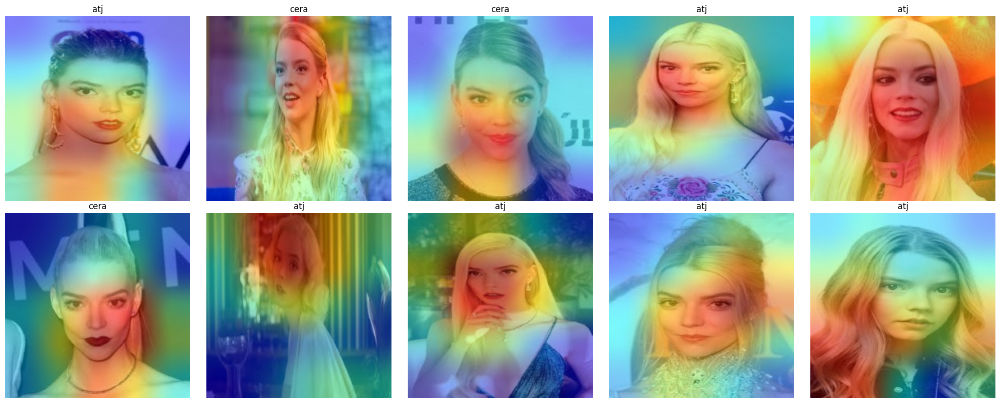

In [190]:
test_directory = directory + "/test/anntaylorjoy"
visualize_predictions(test_directory, model)

1/1 [==============================] - 0s 30ms/step


<ipython-input-189-57ca5d41aa90>:40: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  jet = cm.get_cmap("jet")


1/1 [==============================] - 0s 22ms/step


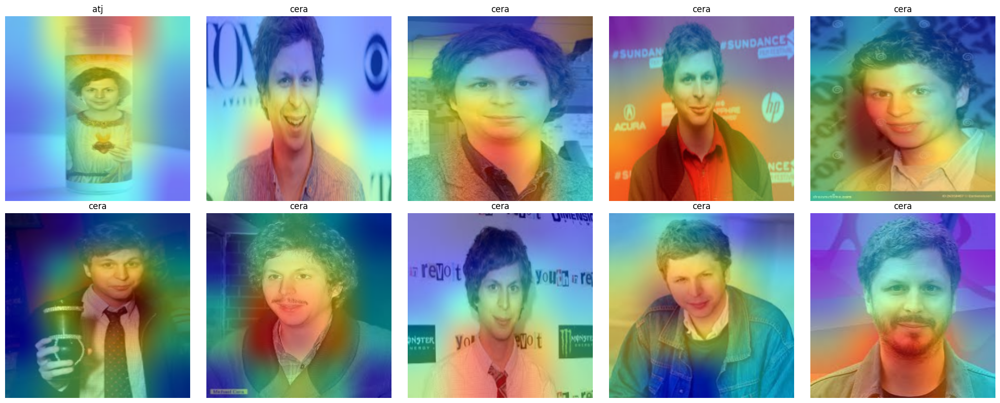

In [191]:
test_directory = directory + "/test/michaelcera"
visualize_predictions(test_directory, model)

1/1 [==============================] - 0s 30ms/step


<ipython-input-189-57ca5d41aa90>:40: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  jet = cm.get_cmap("jet")


1/1 [==============================] - 0s 26ms/step


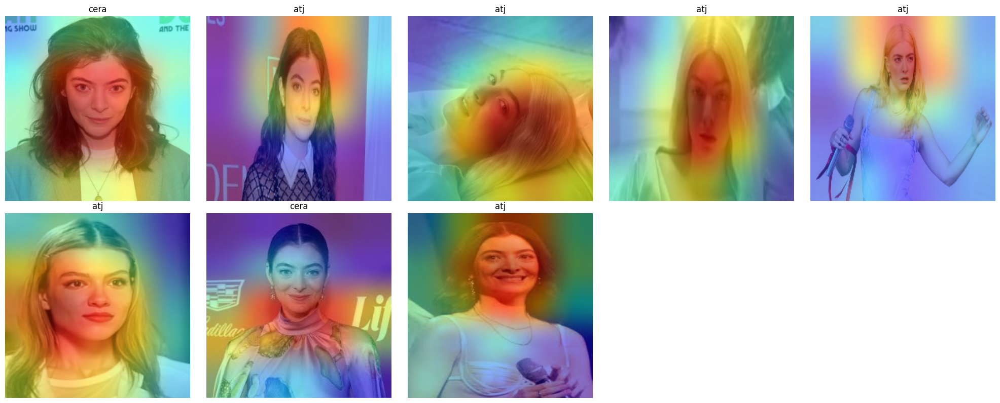

In [192]:
val_directory = directory + "/val/nonatl"
visualize_predictions(val_directory, model)

1/1 [==============================] - 0s 20ms/step


<ipython-input-189-57ca5d41aa90>:40: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  jet = cm.get_cmap("jet")


1/1 [==============================] - 0s 24ms/step


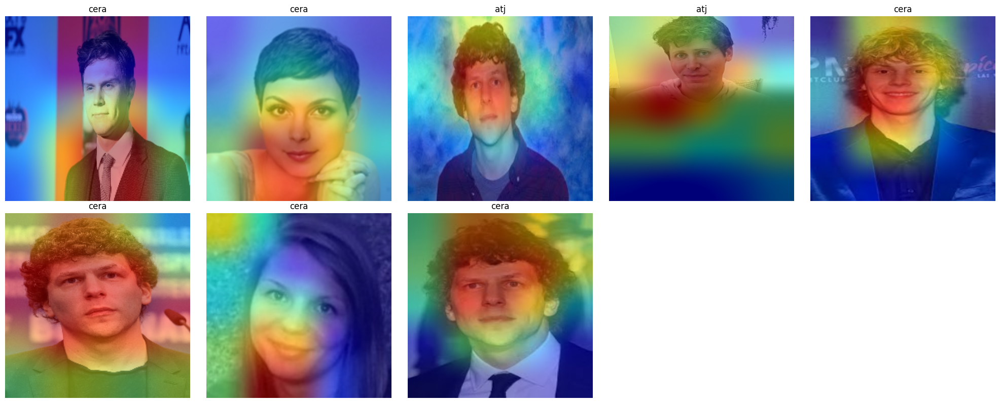

In [193]:
val_directory = directory + "/val/nonmc"
visualize_predictions(val_directory, model)

# Break the classifier

1/1 [==============================] - 0s 31ms/step


<ipython-input-189-57ca5d41aa90>:40: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  jet = cm.get_cmap("jet")


1/1 [==============================] - 0s 18ms/step


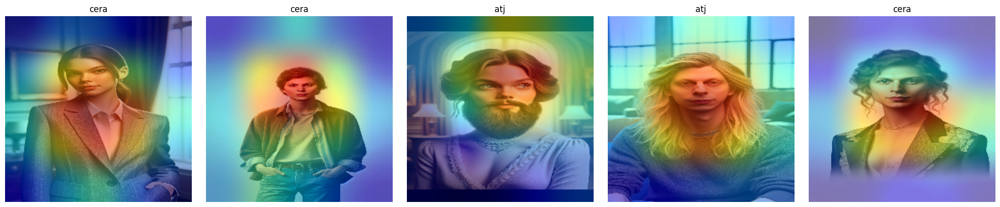

In [194]:
funky_directory = directory + "/funky"
visualize_predictions(funky_directory, model)

# Conclusion

The classifier is pretty decent, here are some observations

- If it sees a suit, it is heavily skewed towards predicting Micheal Cera
- When it comes to hair, it looks at the length and the color
- Instances of looking at the jeans to predict cera
- It is better at predicting ATJ
- Each time I run it, short haired Lorde is predicted as Cera